In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import wfdb
from scipy.signal import find_peaks
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import GridSearchCV

In [2]:
import os
import wfdb

# Defining function to load MIT-BIH data including .xws files
def load_mit_bih_data(record_name):
    # Loading the ECG record
    record = wfdb.rdrecord(record_name)
    
    # Loading the annotations from the .atr file
    annotation = wfdb.rdann(record_name, 'atr')
    
    # Loading the header from the .hea file
    header = wfdb.rdheader(record_name)
    
    # Loading the .xws file 
    xws_file_path = f"{record_name}.xws"
    xws_data = None
    
    if os.path.exists(xws_file_path):
        with open(xws_file_path, 'r') as xws_file:
            xws_data = xws_file.readlines()
    
    return record, annotation, header, xws_data

# Loading all records from the database
database_dir = r'C:\Users\jalad\Downloads\mit-bih-arrhythmia-database-1.0.0\mit-bih-arrhythmia-database-1.0.0'
record_names = [f for f in os.listdir(database_dir) if f.endswith('.hea')]
record_names = [os.path.splitext(f)[0] for f in record_names]

all_records = []
all_annotations = []
all_headers = []
all_xws_data = []

for record_name in record_names:
    full_record_name = os.path.join(database_dir, record_name)
    try:
        record, annotation, header, xws_data = load_mit_bih_data(full_record_name)
        all_records.append(record)
        all_annotations.append(annotation)
        all_headers.append(header)
        all_xws_data.append(xws_data)
        print(f"Loaded record: {record_name}")
    except Exception as e:
        print(f"Error loading record {record_name}: {str(e)}")


Loaded record: 100
Loaded record: 101
Loaded record: 102
Loaded record: 103
Loaded record: 104
Loaded record: 105
Loaded record: 106
Loaded record: 107
Loaded record: 108
Loaded record: 109
Loaded record: 111
Loaded record: 112
Loaded record: 113
Loaded record: 114
Loaded record: 115
Loaded record: 116
Loaded record: 117
Loaded record: 118
Loaded record: 119
Loaded record: 121
Loaded record: 122
Loaded record: 123
Loaded record: 124
Loaded record: 200
Loaded record: 201
Loaded record: 202
Loaded record: 203
Loaded record: 205
Loaded record: 207
Loaded record: 208
Loaded record: 209
Loaded record: 210
Loaded record: 212
Loaded record: 213
Loaded record: 214
Loaded record: 215
Loaded record: 217
Loaded record: 219
Loaded record: 220
Loaded record: 221
Loaded record: 222
Loaded record: 223
Loaded record: 228
Loaded record: 230
Loaded record: 231
Loaded record: 232
Loaded record: 233
Loaded record: 234


In [3]:
# Printing the .xws data for all loaded records
for i, record_name in enumerate(record_names):
    xws_data = all_xws_data[i]
    if xws_data:
        print(f"Content of {record_name}.xws:")
        for line in xws_data:  
            print(line.strip())
        print()  
    else:
        print(f"No .xws file found for {record_name}.")


Content of 100.xws:
-r 100
-a atr
-p http://<!--#echo var="SERVER_NAME" --><!--#echo var="DOCUMENT_URI" -->

Content of 101.xws:
-r 101
-a atr
-p http://<!--#echo var="SERVER_NAME" --><!--#echo var="DOCUMENT_URI" -->

Content of 102.xws:
-r 102
-a atr
-p http://<!--#echo var="SERVER_NAME" --><!--#echo var="DOCUMENT_URI" -->

Content of 103.xws:
-r 103
-a atr
-p http://<!--#echo var="SERVER_NAME" --><!--#echo var="DOCUMENT_URI" -->

Content of 104.xws:
-r 104
-a atr
-p http://<!--#echo var="SERVER_NAME" --><!--#echo var="DOCUMENT_URI" -->

Content of 105.xws:
-r 105
-a atr
-p http://<!--#echo var="SERVER_NAME" --><!--#echo var="DOCUMENT_URI" -->

Content of 106.xws:
-r 106
-a atr
-p http://<!--#echo var="SERVER_NAME" --><!--#echo var="DOCUMENT_URI" -->

Content of 107.xws:
-r 107
-a atr
-p http://<!--#echo var="SERVER_NAME" --><!--#echo var="DOCUMENT_URI" -->

Content of 108.xws:
-r 108
-a atr
-p http://<!--#echo var="SERVER_NAME" --><!--#echo var="DOCUMENT_URI" -->

Content of 109.xws:

In [4]:
# Printing header information for the first record
if all_headers:
    header = all_headers[0]
    print("Record Name:", header.record_name)
    print("Number of Signals:", header.n_sig)
    print("Sampling Frequency:", header.fs)
    print("Number of Samples:", header.sig_len)
    print("Signal Names:", header.sig_name)
    print("Units:", header.units)
    print("ADC Gain:", header.adc_gain)
    print("Baseline:", header.baseline)

Record Name: 100
Number of Signals: 2
Sampling Frequency: 360
Number of Samples: 650000
Signal Names: ['MLII', 'V5']
Units: ['mV', 'mV']
ADC Gain: [200.0, 200.0]
Baseline: [1024, 1024]


In [5]:
import numpy as np
from sklearn.preprocessing import StandardScaler

# Defining preprocessing function
def preprocess_data(signal, header, xws_data=None):
    # Remove NaN values
    signal = np.nan_to_num(signal)
    
    # Converting ADC values to physical units
    for i in range(header.n_sig):
        signal[:, i] = (signal[:, i] - header.baseline[i]) / header.adc_gain[i]
    
    # Scaling
    scaler = StandardScaler()
    signal_scaled = scaler.fit_transform(signal)
    
    # Normalization
    signal_normalized = (signal_scaled - np.min(signal_scaled)) / (np.max(signal_scaled) - np.min(signal_scaled))
    
    
    if xws_data:
        
        for line in xws_data:
            clean_line = line.strip()
            if clean_line.startswith('-r'):
                record_number = clean_line.split()[1]  
                print(f"Record Number from .xws: {record_number}")
            

    return signal_normalized


In [6]:
# Preprocessing all signals, including .xws data if available
preprocessed_signals = []

for record, header, xws_data in zip(all_records, all_headers, all_xws_data):
    preprocessed_signal = preprocess_data(record.p_signal, header, xws_data)
    preprocessed_signals.append(preprocessed_signal)


for i, signal in enumerate(preprocessed_signals):
    print(f"Preprocessed signal {i+1} shape: {signal.shape}")


Record Number from .xws: 100
Record Number from .xws: 101
Record Number from .xws: 102
Record Number from .xws: 103
Record Number from .xws: 104
Record Number from .xws: 105
Record Number from .xws: 106
Record Number from .xws: 107
Record Number from .xws: 108
Record Number from .xws: 109
Record Number from .xws: 111
Record Number from .xws: 112
Record Number from .xws: 113
Record Number from .xws: 114
Record Number from .xws: 115
Record Number from .xws: 116
Record Number from .xws: 117
Record Number from .xws: 118
Record Number from .xws: 119
Record Number from .xws: 121
Record Number from .xws: 122
Record Number from .xws: 123
Record Number from .xws: 124
Record Number from .xws: 200
Record Number from .xws: 201
Record Number from .xws: 202
Record Number from .xws: 203
Record Number from .xws: 205
Record Number from .xws: 207
Record Number from .xws: 208
Record Number from .xws: 209
Record Number from .xws: 210
Record Number from .xws: 212
Record Number from .xws: 213
Record Number 

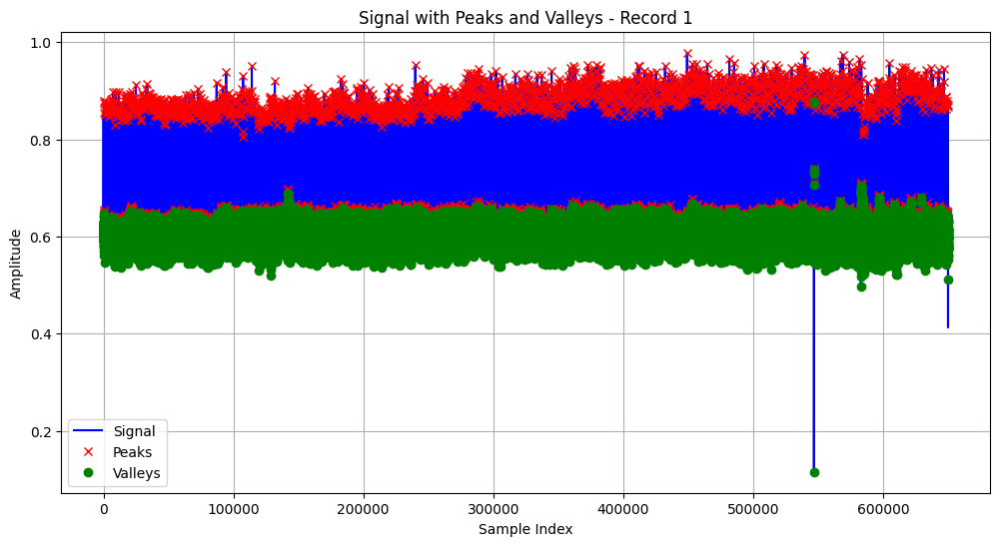

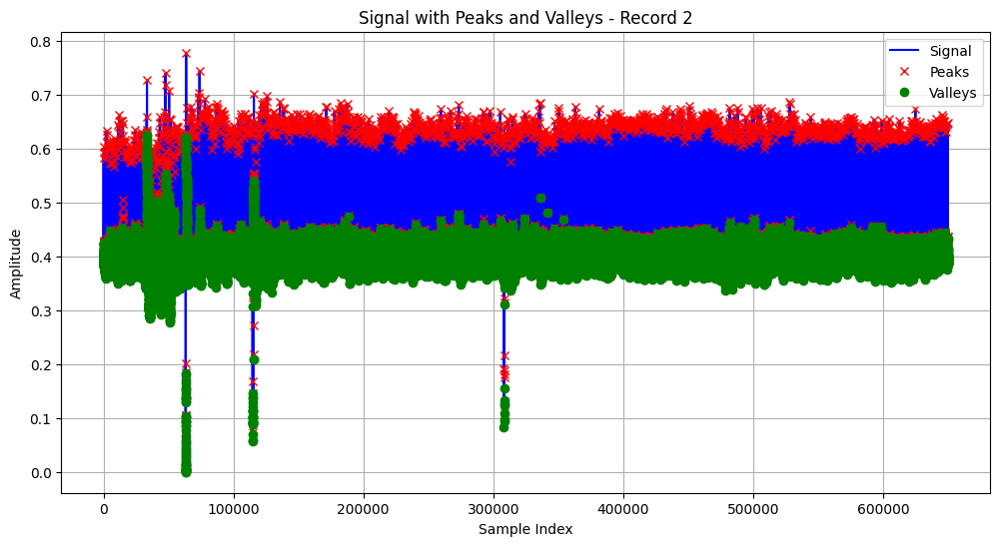

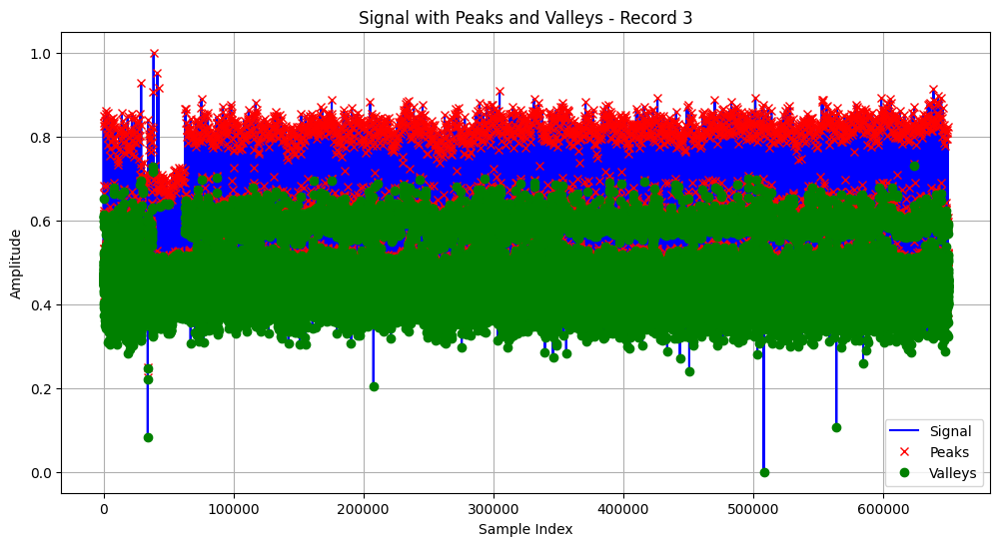

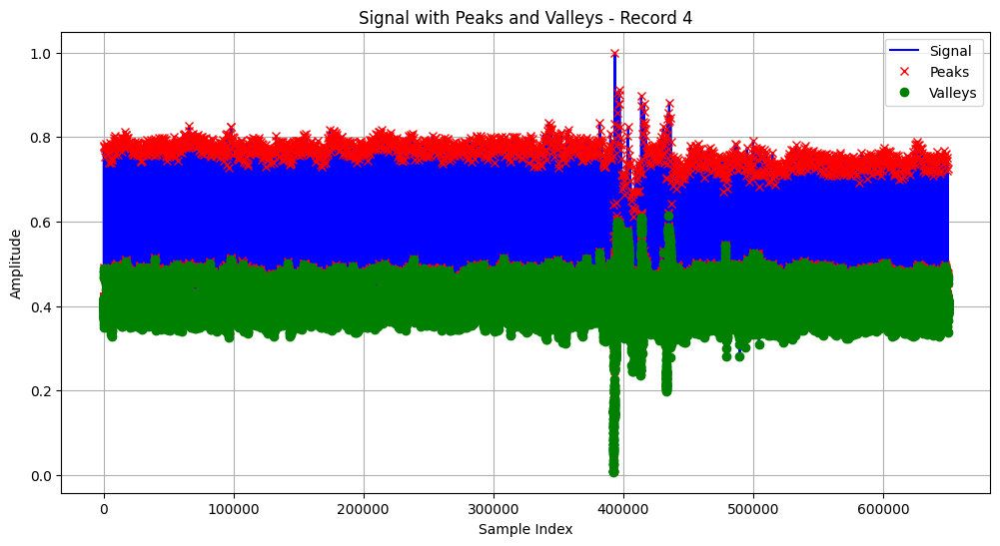

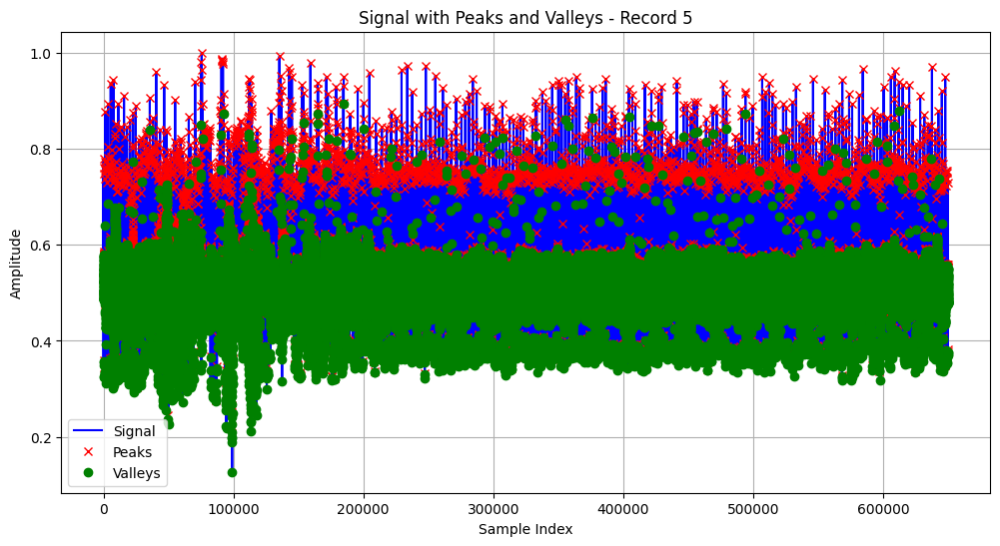

...

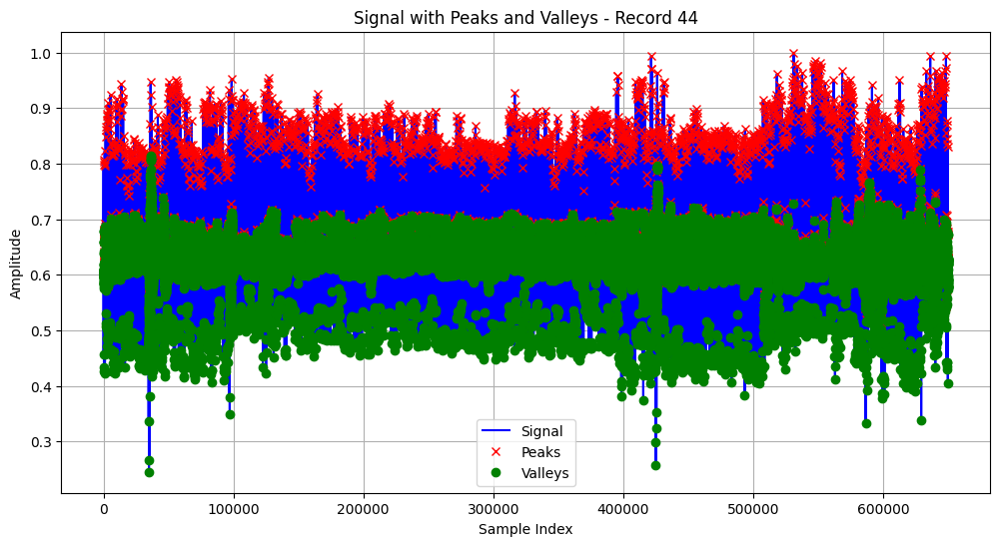

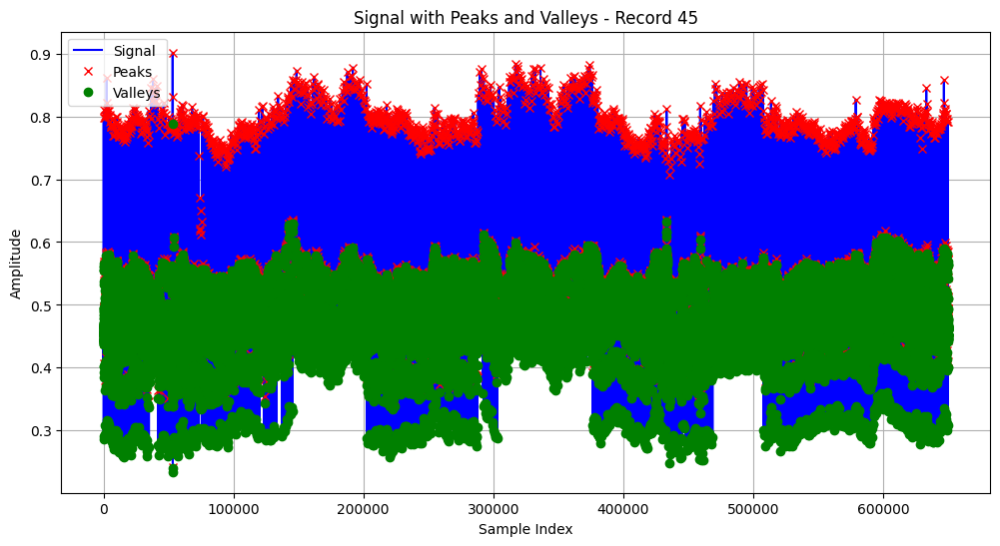

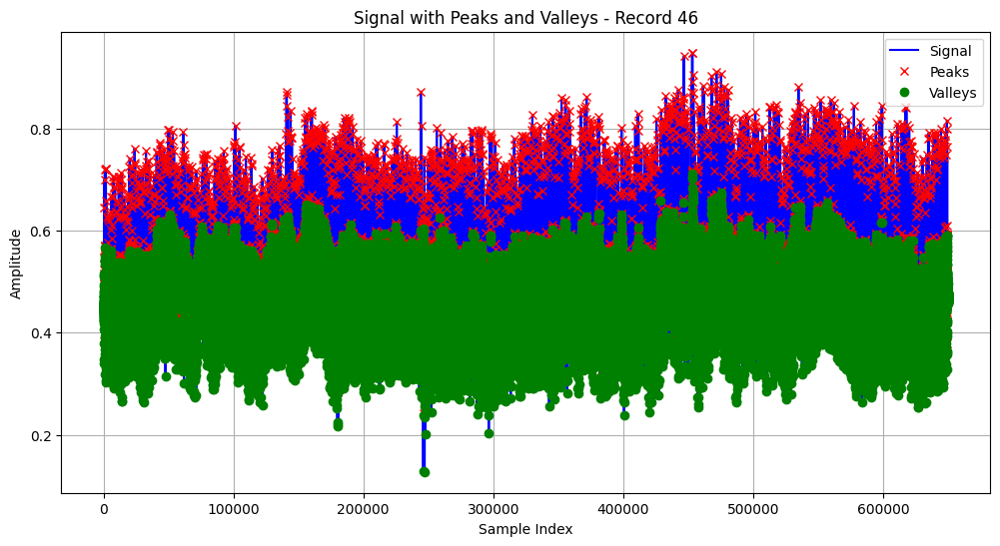

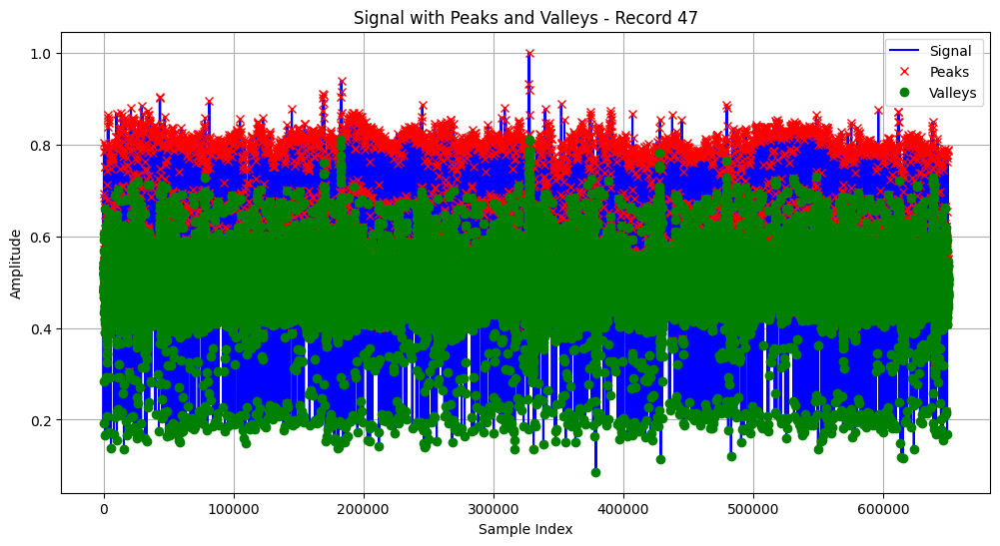

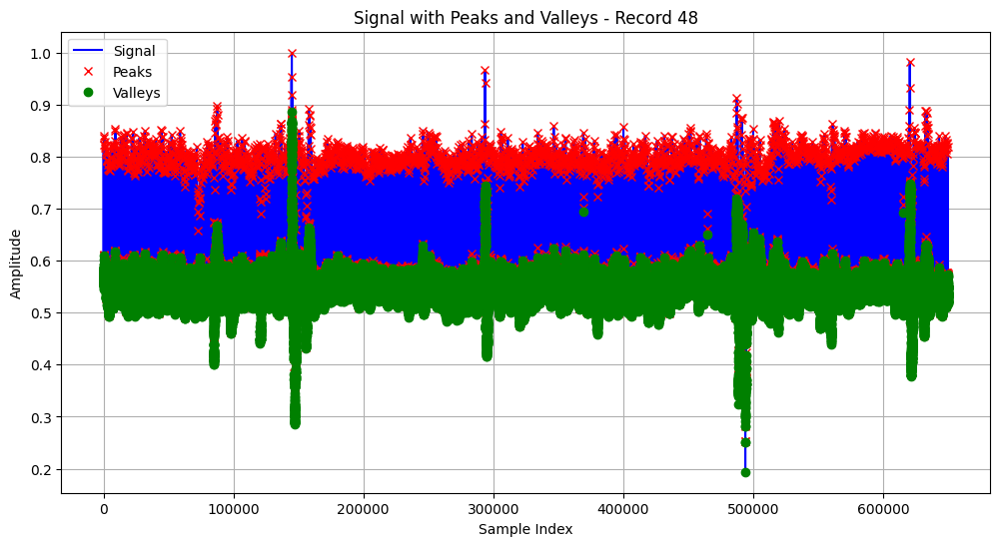

In [7]:
import matplotlib.pyplot as plt
from scipy.signal import find_peaks


def detect_peaks_valleys(signal):
    peaks, _ = find_peaks(signal)
    valleys, _ = find_peaks(-signal)
    return peaks, valleys

# Detecting peaks and valleys for all records
all_peaks_valleys = [detect_peaks_valleys(signal[:, 0]) for signal in preprocessed_signals]

# Displaying peaks and valleys
for i, (signal, (peaks, valleys)) in enumerate(zip(preprocessed_signals, all_peaks_valleys)):
    plt.figure(figsize=(12, 6))
    
    
    plt.plot(signal[:, 0], label='Signal', color='blue')
    
    
    plt.plot(peaks, signal[peaks, 0], "x", color='red', label='Peaks')
    
    
    plt.plot(valleys, signal[valleys, 0], "o", color='green', label='Valleys')
    
    plt.title(f'Signal with Peaks and Valleys - Record {i + 1}')
    plt.xlabel('Sample Index')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid()
    plt.show()


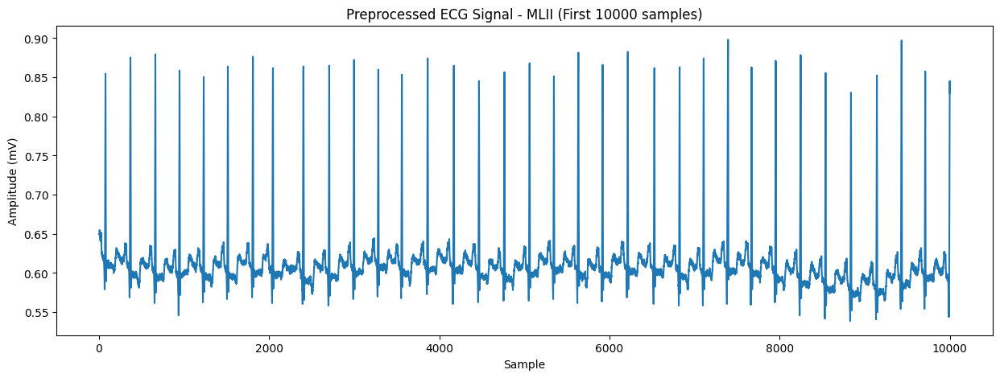

In [8]:
# Visualizing preprocessed data for the first record
plt.figure(figsize=(15, 5))
plt.plot(preprocessed_signals[0][:10000, 0])
plt.title(f'Preprocessed ECG Signal - {all_headers[0].sig_name[0]} (First 10000 samples)')
plt.xlabel('Sample')
plt.ylabel(f'Amplitude ({all_headers[0].units[0]})')
plt.show()

In [9]:
# Defining segmentation function
def segment_signal(signal, window_size, step_size):
    segments = []
    for i in range(0, len(signal) - window_size + 1, step_size):
        segment = signal[i:i+window_size]
        segments.append(segment)
    return np.array(segments)

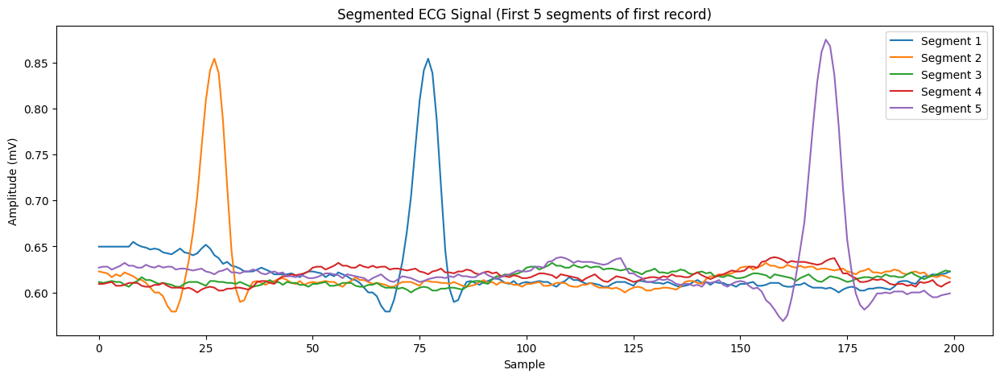

In [10]:
# Segment all signals
window_size = 200  
step_size = 50  
all_segmented_signals = [segment_signal(signal[:, 0], window_size, step_size) for signal in preprocessed_signals]

# Visualizing segmented data for the first record
plt.figure(figsize=(15, 5))
for i in range(5):  # Plotting the first 5 segments of the first record
    plt.plot(all_segmented_signals[0][i], label=f'Segment {i+1}')
plt.title('Segmented ECG Signal (First 5 segments of first record)')
plt.xlabel('Sample')
plt.ylabel(f'Amplitude ({all_headers[0].units[0]})')
plt.legend()
plt.show()

In [11]:
#  Defining function to find optimal window size
def find_optimal_window(signal, min_size, max_size, step):
    best_score = float('-inf')
    best_size = min_size
    for size in range(min_size, max_size + 1, step):
        segments = segment_signal(signal, size, size // 2)  
        score = np.mean([np.std(seg) for seg in segments]) 
        if score > best_score:
            best_score = score
            best_size = size
    return best_size

# Finding optimal window size for all records
optimal_window_sizes = []

for i, record in enumerate(preprocessed_signals):
    # Assuming the first signal of each record is relevant
    signal = record[:, 0]  # Using the first signal in the record
    
    # Find optimal window size for each record
    optimal_window_size = find_optimal_window(signal, 100, 500, 50)
    optimal_window_sizes.append(optimal_window_size)
    
    
    print(f"Record {i+1}: Optimal window size = {optimal_window_size}")

print("\nOptimal window sizes for all records:")
for i, size in enumerate(optimal_window_sizes):
    print(f"Record {i+1}: {size}")


Record 1: Optimal window size = 500
Record 2: Optimal window size = 500
Record 3: Optimal window size = 300
Record 4: Optimal window size = 500
Record 5: Optimal window size = 500
Record 6: Optimal window size = 500
Record 7: Optimal window size = 500
Record 8: Optimal window size = 500
Record 9: Optimal window size = 500
Record 10: Optimal window size = 500
Record 11: Optimal window size = 500
Record 12: Optimal window size = 500
Record 13: Optimal window size = 400
Record 14: Optimal window size = 500
Record 15: Optimal window size = 500
Record 16: Optimal window size = 500
Record 17: Optimal window size = 450
Record 18: Optimal window size = 500
Record 19: Optimal window size = 500
Record 20: Optimal window size = 500
Record 21: Optimal window size = 500
Record 22: Optimal window size = 450
Record 23: Optimal window size = 450
Record 24: Optimal window size = 500
Record 25: Optimal window size = 500
Record 26: Optimal window size = 500
Record 27: Optimal window size = 500
Record 28:

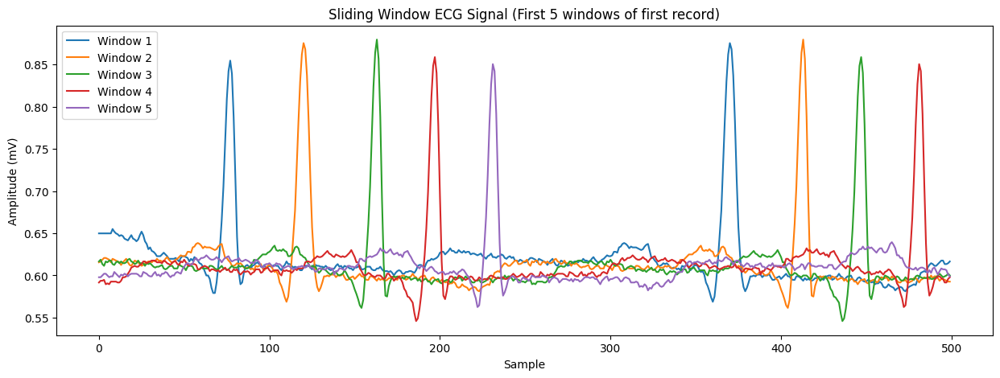

In [12]:
# sliding window with optimal size
sliding_window_segments = [segment_signal(signal[:, 0], optimal_window_size, optimal_window_size // 2) 
                           for signal in preprocessed_signals]

# Visualizing sliding window for the first record
plt.figure(figsize=(15, 5))
for i in range(5):  # Plotting first 5 windows of the first record
    plt.plot(sliding_window_segments[0][i], label=f'Window {i+1}')
plt.title('Sliding Window ECG Signal (First 5 windows of first record)')
plt.xlabel('Sample')
plt.ylabel(f'Amplitude ({all_headers[0].units[0]})')
plt.legend()
plt.show()

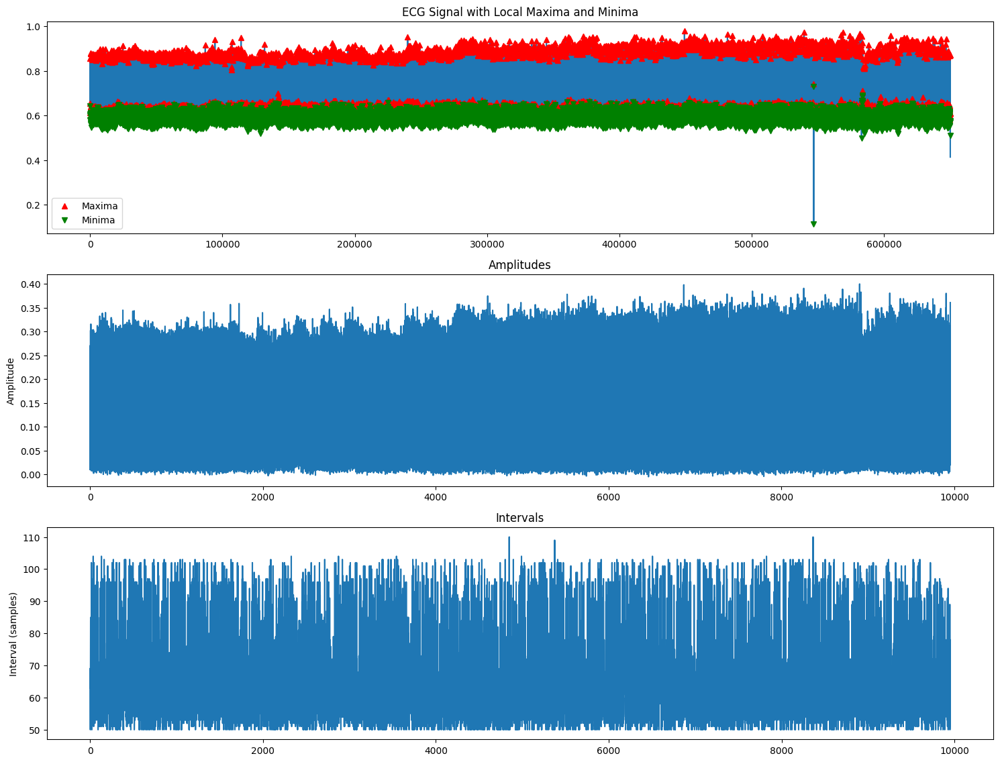

Number of peaks detected: 9953
Average amplitude: 0.09
Average interval: 65.31 samples


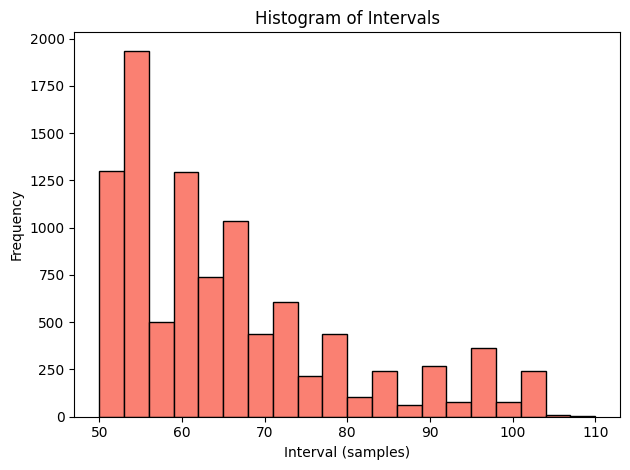

In [13]:
import numpy as np
from scipy.stats import skew, kurtosis

# Defining feature extraction function 
def extract_features(signal, annotation, window_size):
    features = []
    labels = []
    for sample, label in zip(annotation.sample, annotation.symbol):
        if sample + window_size <= len(signal):
            segment = signal[sample:sample + window_size]
            mean = np.mean(segment)
            median = np.median(segment)  
            std = np.std(segment)
            max_val = np.max(segment)
            min_val = np.min(segment)
            range_val = max_val - min_val
            skewness = skew(segment)  
            kurt = kurtosis(segment)   
            features.append([mean, median, std, max_val, min_val, range_val, skewness, kurt])
            labels.append(label)
    return np.array(features), np.array(labels)

# Extract features for all records 
window_size = 500  
all_features = []
all_labels = []
for signal, annotation in zip(preprocessed_signals, all_annotations):
    features, labels = extract_features(signal[:, 0], annotation, window_size)
    all_features.append(features)
    all_labels.append(labels)




# Finding Local Maxima and Minima of Physiological Signals
def find_local_extrema(signal, distance=50):
    maxima, _ = find_peaks(signal, distance=distance)
    minima, _ = find_peaks(-signal, distance=distance)
    return maxima, minima

# Calculating Amplitudes and Intervals
def calculate_amplitudes_intervals(signal, maxima, minima):
    amplitudes = signal[maxima] - np.interp(maxima, minima, signal[minima])
    intervals = np.diff(maxima)
    return amplitudes, intervals

# Process all signals
all_maxima = []
all_minima = []
all_amplitudes = []
all_intervals = []

for signal in preprocessed_signals:
    maxima, minima = find_local_extrema(signal[:, 0])
    amplitudes, intervals = calculate_amplitudes_intervals(signal[:, 0], maxima, minima)
    
    all_maxima.append(maxima)
    all_minima.append(minima)
    all_amplitudes.append(amplitudes)
    all_intervals.append(intervals)

# results for the first record
plt.figure(figsize=(15, 15))

# Plotting original signal with maxima and minima
plt.subplot(4, 1, 1)
plt.plot(preprocessed_signals[0][:, 0])
plt.plot(all_maxima[0], preprocessed_signals[0][all_maxima[0], 0], "r^", label="Maxima")
plt.plot(all_minima[0], preprocessed_signals[0][all_minima[0], 0], "gv", label="Minima")
plt.title("ECG Signal with Local Maxima and Minima")
plt.legend()

# Plotting amplitudes
plt.subplot(4, 1, 2)
plt.plot(all_amplitudes[0])
plt.title("Amplitudes")
plt.ylabel("Amplitude")

# Plotting intervals
plt.subplot(4, 1, 3)
plt.plot(all_intervals[0])
plt.title("Intervals")
plt.ylabel("Interval (samples)")



plt.tight_layout()
plt.show()

# Displaying summary statistics
print(f"Number of peaks detected: {len(all_maxima[0])}")
print(f"Average amplitude: {np.mean(all_amplitudes[0]):.2f}")
print(f"Average interval: {np.mean(all_intervals[0]):.2f} samples")



# Histogram of Intervals
plt.hist(all_intervals[0], bins=20, color='salmon', edgecolor='black')
plt.title("Histogram of Intervals")
plt.xlabel("Interval (samples)")
plt.ylabel("Frequency")

# Adjust layout and display
plt.tight_layout()
plt.show()

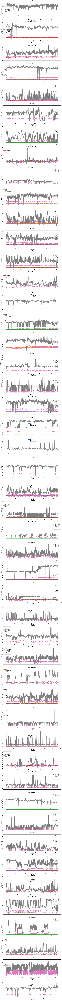

In [14]:
# Defining feature names

feature_names = [
    'Mean', 
    'Median', 
    'Standard Deviation', 
    'Maximum Value', 
    'Minimum Value', 
    'Range', 
    'Skewness', 
    'Kurtosis'
]



# Assuming all_features is already populated with feature arrays for each record
plt.figure(figsize=(15, len(all_features) * 5)) 

for idx in range(len(all_features)):
    plt.subplot(len(all_features), 1, idx + 1)
    for i in range(len(feature_names)):  # Plotting all features for each record
        plt.plot(all_features[idx][:, i], label=feature_names[i])
    
    plt.title(f'Feature Plot (Record {idx + 1})')
    plt.xlabel('Window Number')  
    plt.ylabel('Feature Value')
    plt.legend()

plt.tight_layout()  
plt.show()



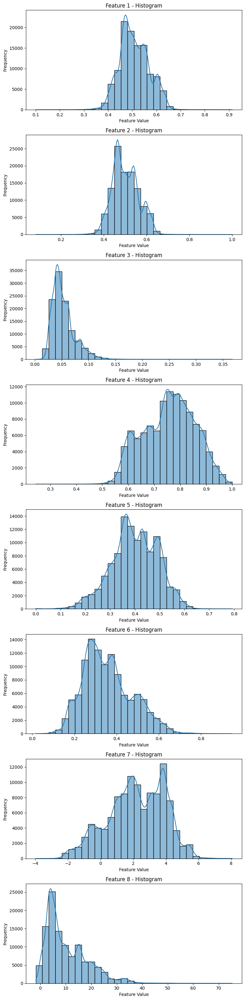

In [15]:
# Visualizing distribution of features for all records

import seaborn as sns
import numpy as np


all_features_concat = np.concatenate(all_features, axis=0)


num_features = all_features_concat.shape[1]


plt.figure(figsize=(15, num_features * 4))


for i in range(num_features):
    plt.subplot(num_features, 2, 2 * i + 1)  
    sns.histplot(all_features_concat[:, i], bins=30, kde=True)
    plt.title(f'Feature {i+1} - Histogram')
    plt.xlabel('Feature Value')
    plt.ylabel('Frequency')

    
plt.tight_layout()
plt.show()


In [16]:
from sklearn.preprocessing import LabelEncoder

def prepare_classification_data(all_features, all_labels, all_amplitudes, all_intervals):
    # Combining features from different sources
    X = []
    y = []
    
    for features, labels, amplitudes, intervals in zip(all_features, all_labels, all_amplitudes, all_intervals):
        
        min_length = min(len(features), len(amplitudes), len(intervals) + 1) 
        
        # Combining features 
        combined_features = np.hstack((
            features[:min_length-1],  
            amplitudes[:min_length-1].reshape(-1, 1),  
            intervals[:min_length-1].reshape(-1, 1) 
        ))
        
        X.append(combined_features)
        y.append(labels[:min_length-1])  
    
    # Concatenating data from all records
    X = np.vstack(X)
    y = np.concatenate(y)
    
    return X, y

# Applying the function to prepare data
X, y = prepare_classification_data(all_features, all_labels, all_amplitudes, all_intervals)

alpha_mask = np.array([c.isalpha() for c in y])
X = X[alpha_mask]
y = y[alpha_mask]

# Converting string labels to numeric
le = LabelEncoder()
y_numeric = le.fit_transform(y)
class_names = le.classes_
print(f"Number of classes: {len(class_names)}")
print(f"Alphabetic classes: {class_names}")


Number of classes: 15
Alphabetic classes: ['A' 'E' 'F' 'J' 'L' 'N' 'Q' 'R' 'S' 'V' 'a' 'e' 'f' 'j' 'x']


In [17]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report
from sklearn.feature_selection import RFE
import warnings
warnings.filterwarnings('ignore')

# Splitting and scaling data
X_train, X_test, y_train, y_test = train_test_split(X, y_numeric, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Performing Recursive Feature Elimination for feature selection
def perform_rfe(X_train, y_train, model, num_features):
    print(f"\nPerforming RFE to select top {num_features} features...")
    
    
    rfe = RFE(estimator=model, n_features_to_select=num_features)
    rfe.fit(X_train, y_train)
    
    
    selected_features = rfe.support_
    
    
    X_train_rfe = rfe.transform(X_train)
    X_test_rfe = rfe.transform(X_test_scaled)
    
    print(f"Selected features: {np.where(selected_features)[0]}")
    
    return X_train_rfe, X_test_rfe


selection_model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)


num_features_to_select = 6


X_train_rfe, X_test_rfe = perform_rfe(X_train_scaled, y_train, selection_model, num_features_to_select)

def train_and_evaluate_model(model, params, model_name, X_train, X_test, y_train, y_test):
    print(f"\nTraining {model_name}...")
    
    random_search = RandomizedSearchCV(
        model, 
        params, 
        cv=3, 
        n_jobs=-1, 
        verbose=1, 
        n_iter=5,
        error_score='raise'
    )
    random_search.fit(X_train, y_train)
    
    best_model = random_search.best_estimator_
    y_pred = best_model.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    
    print(f"\n{model_name} Performance:")
    print(f"Best Parameters: {random_search.best_params_}")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))
    
    return {
        'model': best_model,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'best_params': random_search.best_params_
    }

# 1. Random Forest
rf_params = {
    'n_estimators': [100],
    'max_depth': [10, 20],
    'min_samples_split': [2, 5]
}
rf_model = RandomForestClassifier(random_state=42, n_jobs=-1)
rf_results = train_and_evaluate_model(
    rf_model, rf_params, "Random Forest", 
    X_train_rfe, X_test_rfe, y_train, y_test
)

# 2. Linear SVM
svm_params = {
    'C': [0.1, 1.0],
    'max_iter': [1000],
    'dual': [False]
}
svm_model = LinearSVC(random_state=42)
svm_results = train_and_evaluate_model(
    svm_model, svm_params, "Linear SVM", 
    X_train_rfe, X_test_rfe, y_train, y_test
)

# 3. Neural Network
ann_params = {
    'hidden_layer_sizes': [(50,), (100,)],
    'activation': ['relu'],
    'learning_rate_init': [0.001],
    'max_iter': [300],
    'early_stopping': [True],
    'n_iter_no_change': [10]
}
ann_model = MLPClassifier(random_state=42)
ann_results = train_and_evaluate_model(
    ann_model, ann_params, "Neural Network", 
    X_train_rfe, X_test_rfe, y_train, y_test
)


results_df = pd.DataFrame({
    'Model': ['Random Forest', 'Linear SVM', 'Neural Network'],
    'Accuracy': [rf_results['accuracy'], svm_results['accuracy'], ann_results['accuracy']],
    'Precision': [rf_results['precision'], svm_results['precision'], ann_results['precision']],
    'Recall': [rf_results['recall'], svm_results['recall'], ann_results['recall']]
})


results_df = results_df.round(4)
print("\nModel Comparison:")
print(results_df)


best_model_name = results_df.loc[results_df['Accuracy'].idxmax(), 'Model']
best_accuracy = results_df['Accuracy'].max()
print(f"\nBest performing model: {best_model_name}")
print(f"Best model accuracy: {best_accuracy:.4f}")



Performing RFE to select top 6 features...
Selected features: [0 2 4 5 6 7]

Training Random Forest...
Fitting 3 folds for each of 4 candidates, totalling 12 fits

Random Forest Performance:
Best Parameters: {'n_estimators': 100, 'min_samples_split': 2, 'max_depth': 20}
Accuracy: 0.9000
Precision: 0.8909
Recall: 0.9000

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.49      0.60       428
           1       1.00      0.77      0.87        22
           2       0.58      0.20      0.30       166
           3       1.00      0.27      0.43        11
           4       0.89      0.85      0.87      1582
           5       0.91      0.97      0.94     15040
           6       0.00      0.00      0.00        10
           7       0.90      0.89      0.89      1475
           9       0.76      0.58      0.66      1453
          10       1.00      0.03      0.06        33
          11       0.00      0.00      0.00         4
     

In [ ]:
# code reference 
# https://medium.com/@protobioengineering/how-to-get-heart-data-from-the-mit-bih-arrhythmia-database-e452d4bf7215
